# Поиск по изображениям

## Введение

**Описание проекта**

Заказчик проекта — фотохостинг для профессиональных фотографов «Со Смыслом» (“With Sense”). 

Пользователи сервиса размещают свои фотографии на хостинге и сопровождают их полным описанием: указывают место съёмок, модель камеры и т. д. Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала. 

Заказчик задумал разработать поиск референсных фотографий для фотографов. Суть поиска заключается в том, что пользователь сервиса вводит описание нужной сцены, а сервис выводит несколько фотографий с такой же или похожей сценой.

Отдельное требование: при разоработке модели учесть юридические ограничения и действующее законодательство в области  обработки изображений с несовершеннолетними.

**Цель проекта:**

Разработать демонстрационную версию поиска изображений по запросу.

Для этого нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

**Описание данных:**

Данные лежат в папке `/datasets/image_search/` или доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

*`train_dataset.csv`* — информация, необходимая для обучения:
   - Имя файла изображения, идентификатор описания и текст описания. 
   - Для одной картинки может быть доступно до 5 описаний. 
   - Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

*`train_images`* — папка с изображениями для тренировки модели.

*`CrowdAnnotations.tsv`* — данные по соответствию изображения и описания, полученные **с помощью краудсорсинга**. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

*`ExpertAnnotations.tsv`* — данные по соответствию изображения и описания, полученные **в результате опроса экспертов**. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

*`test_queries.csv`* — информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

*`test_images`* — папка с изображениями для тестирования модели.

*`test_images.csv`* — файл с названиями изображений для тестирования.

**План выполнения проекта:**

- Загрузить данные и провести исследовательский анализ данных.
- Подготовить данные к обучению модели.
- Обучить модель.
- Провести тестирование модели и продемонстрировать ее работу.
- Сделать общий и промежуточные выводы.

## Загрузка и исследовательский анализ данных

In [1]:
# импортируем библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from math import sqrt

from PIL import Image

import re
import nltk
from nltk.stem import WordNetLemmatizer 
from nltk.corpus import stopwords as nltk_stopwords
from nltk.corpus import wordnet as nltk_wordnet
from collections import Counter

from tqdm import tqdm

import torch
import torch.nn as nn
import transformers
import torchvision.models as models
from torchvision import transforms
import os

from sklearn.model_selection import GroupShuffleSplit
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.dummy import DummyRegressor
import catboost

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error

import sentence_transformers
from sentence_transformers import SentenceTransformer, util
import glob

# настраиваем отображение
import warnings
warnings.filterwarnings('ignore')

# задаем константы 
PATH = '../Downloads/to_upload/'
RAND_ST = 12345
BATCH_SIZE=106
BLOCK = ['teenage',
         'teenager',
         'teenagers',
         'baby',
         'babe',
         'girl',
         'girls',
         'boy',
         'boys',
         'child', 
         'kid', 
         'kids',
         'youngster',
         'youth',
         'young'
         ]

np.random.seed(RAND_ST)
torch.manual_seed(RAND_ST)
# torch.use_deterministic_algorithms(True)

# настраиваем производительность
gpu = torch.device("cuda:0" if torch.cuda.is_available() else "cpu");

2024-07-12 20:06:52.739435: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


- Загрузим и прочитаем данные.

In [2]:
# загружаем данные и читаем файлы
def read_df(path) -> pd.DataFrame:

    '''читаем датафреймы из указанного источника'''
    
    df_train = pd.read_csv(path + 'train_dataset.csv')
    df_crowd = pd.read_csv(path + 'CrowdAnnotations.tsv', sep='\t',
                           names=['image', 'query_id', 'share_pos', 'count_pos', 'count_neg'])
    df_expert = pd.read_csv(path + 'ExpertAnnotations.tsv', sep='\t',
                           names=['image', 'query_id', 'first', 'second', 'third'])
    df_queries = pd.read_csv(path + 'test_queries.csv', index_col=[0], sep='|')
    df_images = pd.read_csv(path + 'test_images.csv', sep='|')
    
    return df_train, df_crowd, df_expert, df_queries, df_images

df_train, df_crowd, df_expert, df_queries, df_images = read_df(PATH)

In [3]:
# задаем параметры общей информации о датасете
def frame_info(data):
    display(data.head(10))
    print()
    data.info()
    print()
    print('Количество дубликатов:', data.duplicated().sum())    

### Train_dataset

В файле train_dataset.csv находится информация, необходимая для обучения:

- Имя файла изображения.
- Идентификатор описания.
- Текст описания.

Для одной картинки может быть доступно до 5 описаний.

Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

- Изучим датасет более детально. 

In [4]:
# выводим информацию о датасете 
frame_info(df_train)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB

Количество дубликатов: 0


In [5]:
# выводим количество уникальных описаний и изображений 
print('Количество уникальных описаний:', df_train.query_text.nunique())
print('Количество уникальных изображений:', df_train.image.nunique())

Количество уникальных описаний: 977
Количество уникальных изображений: 1000


- Проверим порядковые номера описаний.

In [6]:
# выводим порядковые номера описаний 
df_train['query_id'].str[-1:].unique()

array(['2'], dtype=object)

- Посмотрим наиболее употребляемые в описаниях слова.

In [7]:
# подготавливаем текст 
stops = set(nltk_stopwords.words('english'))

def mostCommonWords(concordanceList):
    finalCount = Counter()
    for line in concordanceList:
        line = re.sub('[^a-zA-Z]', ' ', line).lower()
        words = [w for w in line.split(" ") if w not in (stops)]
        finalCount.update(words)
    return finalCount.most_common(10)

most_common_words = pd.DataFrame(
    mostCommonWords(df_train["query_text"]), 
                    columns=['word','count']).reset_index()

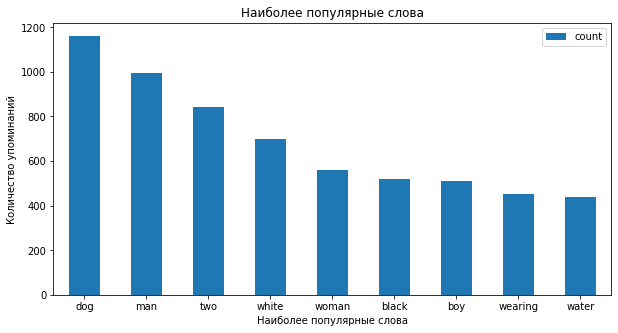

In [8]:
# выводим график
fig, ax = plt.subplots(figsize=(10,5))
(most_common_words[most_common_words['word'] != '']
                   .plot(kind='bar', 
                    x='word', 
                    y='count',
                    ax=ax,
                    rot=0,
                    title='Наиболее популярные слова'))

ax.set_xlabel('Наиболее популярные слова')
ax.set_ylabel('Количество упоминаний')
plt.show()

**Вывод:**
- В обучающем датасете 5822 строк с 977 описаниями к 1000 изображениями. Пропусков нет, дубликатов нет.  
- Данные в датасете соответствуют описанию к задаче. 
- У всех описаний один порядковый номер — 2.
- Самое частое слово в описаниях  — собака. 
- Среди самых популярных присутствует слово, попадающее под законодательный запрет, — мальчик.  

### CrowdAnnotations

В файле CrowdAnnotations.tsv — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

- Имя файла изображения.
- Идентификатор описания.
- Доля людей, подтвердивших, что описание соответствует изображению.
- Количество человек, подтвердивших, что описание соответствует изображению.
- Количество человек, подтвердивших, что описание не соответствует изображению. 

- Изучим данные.  

In [9]:
# выводим информацию о датасете 
frame_info(df_crowd)

,image,query_id,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000000,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000000,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000000,0,3
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.000000,0,3
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.000000,0,3
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,0.333333,1,2
8,1056338697_4f7d7ce270.jpg,2307118114_c258e3a47e.jpg#2,0.000000,0,3
9,1056338697_4f7d7ce270.jpg,2309860995_c2e2a0feeb.jpg#2,0.000000,0,3



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      47830 non-null  object 
 1   query_id   47830 non-null  object 
 2   share_pos  47830 non-null  float64
 3   count_pos  47830 non-null  int64  
 4   count_neg  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB

Количество дубликатов: 0


- Посмотрим соотношение верных и неверных описаний.

In [10]:
# задаем функцией параметры графика соотношения верных и неверных описаний
def pos_neg_count(df, field_1, field_2):
    percent_dict = {'Оценка': ['Верные описания', 'Неверные описания'],
                    'Процент от общего числа записей':[
                        df[df[field_1] > 0]['query_id'].count() / df.shape[0],
                        df[df[field_2] > 0]['query_id'].count() / df.shape[0]
                    ]
                   }
    
    data = pd.DataFrame(percent_dict)
    
    fix, ax  = plt.subplots(figsize=(10, 5))
    data.plot(kind='barh', 
              y='Процент от общего числа записей',
              x='Оценка',
              ax=ax,
              title='Соотношение изображений к верным и неверным описаниям')
    ax.set_ylabel('Оценка')
    ax.set_xlabel('Доля оценок')
    plt.show()

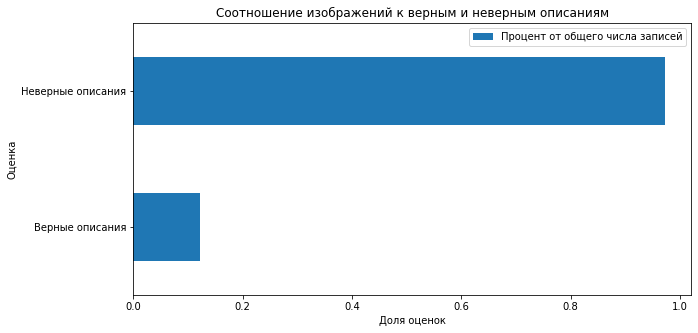

In [11]:
# выводим график
pos_neg_count(df_crowd, 'count_pos', 'count_neg')

**Вывод:**

- В датасете с оценками 47830 строк. Пропусков и дубликатов нет.  
- Данные в датасете соответствуют описанию к задаче. 
- Доля описаний, не соответствующих изображению, судя по оценкам, намного выше. 

### ExpertAnnotations

В файле ExpertAnnotations.tsv — данные по соответствию изображения и описания, полученные в результате опроса экспертов.

Номера колонок и соответствующий тип данных:

- Имя файла изображения.
- Идентификатор описания.
- 3, 4, 5 — оценки трёх экспертов.


Эксперты ставят оценки по шкале от 1 до 4, где:

1. — изображение и запрос совершенно не соответствуют друг другу.
2. — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует.
3. — запрос и текст соответствуют с точностью до некоторых деталей.
4. — запрос и текст соответствуют полностью.

- Исследуем данные.

In [12]:
# выводим информацию о датасете 
frame_info(df_expert)

,image,query_id,first,second,third
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2
8,106490881_5a2dd9b7bd.jpg,1425069308_488e5fcf9d.jpg#2,1,1,1
9,106490881_5a2dd9b7bd.jpg,1714316707_8bbaa2a2ba.jpg#2,2,2,2



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   first     5822 non-null   int64 
 3   second    5822 non-null   int64 
 4   third     5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB

Количество дубликатов: 0


- Посмотрим распределение средних оценок экспертов.

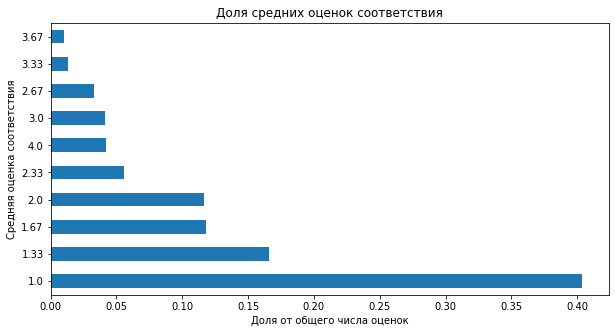

In [13]:
# считаем среднее и доли 
mean_ranks = (((df_expert['first'] + df_expert['second'] + df_expert['third']) / 3)
              .round(2)
              .value_counts(normalize=True))

# выводим график
fig, ax = plt.subplots(figsize=(10,5))
mean_ranks.plot(kind='barh', title='Доля средних оценок соответствия', ax=ax)
ax.set_xlabel('Доля от общего числа оценок')
ax.set_ylabel('Средняя оценка соответствия')
plt.show()

**Вывод:**

- В датасете с оценками экспертов 5822 строк. Пропусков и дубликатов нет.  
- Данные в датасете соответствуют описанию к задаче. 
- Распределение средних оценок свидетельствует о преобладании в датасете неверных описаний.  

### Test_queries

В файле test_queries.csv находится информация, необходимая для тестирования:

- Идентификатор запроса.
- Текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний.
- Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

- Изучим данные более пристально. 

In [14]:
# выводим информацию о датасете 
frame_info(df_queries)

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg
5,1232148178_4f45cc3284.jpg#0,A baby girl playing at a park .,1232148178_4f45cc3284.jpg
6,1232148178_4f45cc3284.jpg#1,A closeup of a child on a playground with adul...,1232148178_4f45cc3284.jpg
7,1232148178_4f45cc3284.jpg#2,A young boy poses for a picture in front of a ...,1232148178_4f45cc3284.jpg
8,1232148178_4f45cc3284.jpg#3,A young girl is smiling in front of the camera...,1232148178_4f45cc3284.jpg
9,1232148178_4f45cc3284.jpg#4,There is a little blond hair girl with a green...,1232148178_4f45cc3284.jpg



<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB

Количество дубликатов: 0


In [15]:
# выводим количество уникальных описаний и изображений 
print('Количество уникальных описаний:', df_queries.query_text.nunique())
print('Количество уникальных изображений:', df_queries.image.nunique())

Количество уникальных описаний: 500
Количество уникальных изображений: 100


- Проверим порядковые номера описаний и все ли изображения соответствуют описанию (в столбце *query_id* зашифрована информация о номере картинки к которой дано описание в столбце *query_text*).

In [16]:
# выводим порядковые номера описаний 
df_queries['query_id'].str[-1:].unique()

array(['0', '1', '2', '3', '4'], dtype=object)

In [17]:
# проверяем соответствие фото его описанию
df_queries[df_queries['query_id'].str[:-2] != df_queries['image']].shape[0]

0

- Посмотрим наиболее употребляемые в описаниях слова.

In [18]:
# подготавливаем текст 
most_common_words = pd.DataFrame(
    mostCommonWords(df_queries["query_text"]), 
                    columns=['word','count']).reset_index()

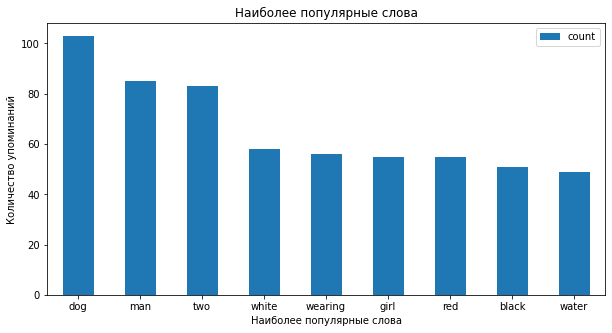

In [19]:
# выводим график
fig, ax = plt.subplots(figsize=(10,5))
(most_common_words[most_common_words['word'] != '']
                  .plot(kind='bar', 
                   x='word', 
                   y='count',
                   ax=ax,
                   rot=0,
                   title='Наиболее популярные слова'))

ax.set_xlabel('Наиболее популярные слова')
ax.set_ylabel('Количество упоминаний')
plt.show()

**Вывод:**

- В тестовом датасете 500 строк-уникальных описаний на 100 изображений. Пропусков и дубликатов нет.  
- Данные в датасете соответствуют описанию к задаче. 
- Порядок столбцов в тестовом датасете отличается от порядка в обучающем наборе.
- Каждой картинке соответствует пять описаний.
- Все изображения соответствуют описанию.
- Самое частое слово в описаниях — собака. Такое же, как в обучающем наборе.  
- Среди самых популярных присутствует слово, попадающее под законодательный запрет, — девочка. 
    

- Сравним данные в датасетах.

### Общая аналитика

- Сравним количество изображений, описаний и их пар в разных датасетах. 

In [20]:
# выводим количество уникальных фото разных наборов
print('Количество уникальных фото на трейне:', df_train['image'].nunique())
print('Количество уникальных фото на тесте:', df_queries['image'].nunique())

Количество уникальных фото на трейне: 1000
Количество уникальных фото на тесте: 100


In [21]:
# выводим количество уникальных описаний разных наборов
print('Количество уникальных описаний на трейне:', df_train.query_text.nunique())
print('Количество уникальных описаний на тесте:', df_queries.query_text.nunique())

Количество уникальных описаний на трейне: 977
Количество уникальных описаний на тесте: 500


In [22]:
# выводим количество уникальных пар фото-текст разных оценщиков
print('Количество уникальных сочетаний фото-текст, оцененных экспертами:', df_expert.shape[0])
print('Количество уникальных сочетаний фото-текст, оцененных людьми:', df_crowd.shape[0])

Количество уникальных сочетаний фото-текст, оцененных экспертами: 5822
Количество уникальных сочетаний фото-текст, оцененных людьми: 47830


- Количество фото в обучающем наборе в 10 раз больше. А уникальных описаний — только в два раза. 
- Количество экспертных оценок меньше краудсорсинговых почти в девять раз. 

- Проверим, есть ли утечка данных между обучающим и тестовым наборами.

In [23]:
print('Уникальных текстовых описаний в трейне:', df_train['query_text'].nunique())
print('Уникальных текстовых описаний в тесте:', df_queries['query_text'].nunique())
print('Уникальных текстовых описаний которые есть в обоих наборах:', 
                  len(set(df_train['query_text']) & set(df_queries['query_text'])))

Уникальных текстовых описаний в трейне: 977
Уникальных текстовых описаний в тесте: 500
Уникальных текстовых описаний которые есть в обоих наборах: 0


In [24]:
print('Уникальных картинок в трейне:', df_train['image'].nunique())
print('Уникальных картинок в тесте:', df_queries['image'].nunique())
print('Уникальных картинок которые есть в обоих наборах:', len(
                 set(df_train['image']) & set(df_queries['image'])))

Уникальных картинок в трейне: 1000
Уникальных картинок в тесте: 100
Уникальных картинок которые есть в обоих наборах: 0


- Утечки не наблюдается. 

- Познакомимся с изображениями, входящими в датасеты.

Изображения из обучающего набора


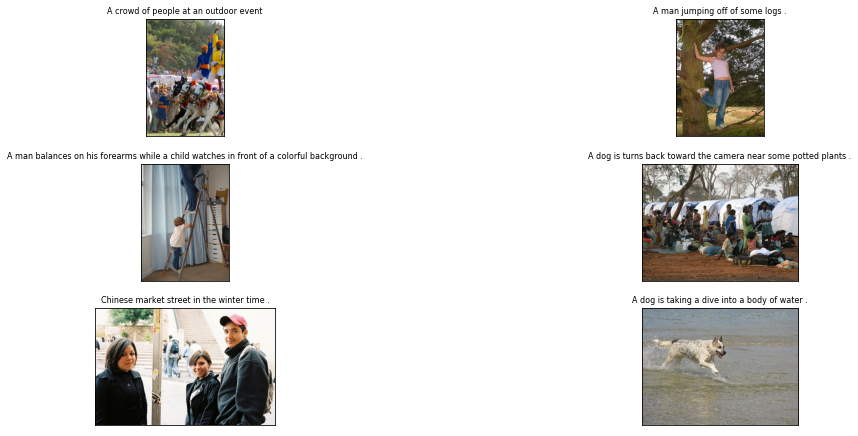

In [25]:
# формируем списки выборок
samples_train = df_train.sample(6)
samples_test = df_queries.sample(6)

# формируем график для обучающего набора
fig = plt.figure(figsize=(15,10))

for i in range(6):
    fig.add_subplot(5, 2, i+5)
    # добавляем картинки для обучения
    image = Image.open(PATH+'train_images/'+ samples_train['image'].iloc[i])
    # добавляем описание
    plt.title(samples_train['query_text'].iloc[i], fontsize=8)
    plt.imshow(image)   
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    
print("Изображения из обучающего набора");

Изображения из тестового набора


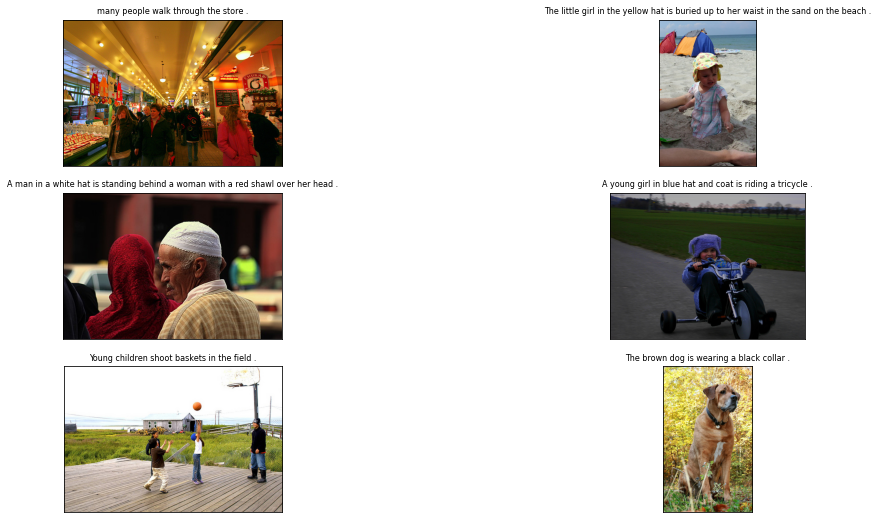

In [26]:
# формируем график для тестового набора
fig = plt.figure(figsize=(15,12))

for i in range(6):
    fig.add_subplot(5, 2, i+5)
    # добавляем картинки для теста
    image = Image.open(PATH+'test_images/'+samples_test['image'].iloc[i])
    # добавляем описание
    plt.title(samples_test['query_text'].iloc[i], fontsize=8)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
print("Изображения из тестового набора");    

- Фотографии в одинаковом разрешении, в цвете, есть картинки с нежелательным контентом.
- Не все описания в обучающем наборе соответствуют изображению. 

**Вывод:**

- Количество фото и уникальных описаний в обучающем наборе намного больше, чем в тестовом.
- Количество экспертных оценок меньше краудсорсинговых.
- Утечки между тестовым и обучающим наборами не наблюдается.
- Изображения в хорошем качестве.

### Агрегация оценок

Датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

- В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки (1, 2, 3, 4) от трёх специалистов.


- В файле с краудсорсинговыми оценками информация расположена в таком порядке:
  1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
  2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
  3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.


- Для решения задачи нам требуется:
  1. Агрегировать оценки экспертов (превратить в одну). 
  2. Привести их к диапазону 0,1 (нормализовать), так как модель должна возвращать на выходе вероятность соответствия изображения тексту, т.е. целевая переменная должна иметь значения от 0 до 1.  
  3. Объединить экспертные и краудсорсинговые оценки, дифференцировав каждую, или выбрать одну из них.

**Стратегия агрегации оценок:**

- Если две из трех оценок экспертов одинаковые, будем голосовать большинством, если все оценки разные — усредним.
- Данные нормализуем (приведем к диапазону [0,1]) по формуле:$$yi = (xi – мин(х)) / (макс(х) – мин(х))$$

- После агрегации оценок экспертов, объединим их с краудсорсинговыми с коэффициентами, соответсовенно, 0.7 и 0.3. 

- Объединять будем так, чтобы оставить в датасете в основном оценки экспертов — они надежнее.

In [27]:
# агрегируем и нормализуем оценки экспертов 
def expert_aggregate(row) -> object:

    # если оценки разные - усредняем
    if row['first'] != row['second'] != row['third']: 
        row['expert_score'] = (row['first'] + row['second'] + row['third'] - 3) / 9
    
    # если есть одинаковые оценки - аггрегируем голосованием
    else: 
        row['expert_score'] = (max(set([row['first'], row['second'], row['third']]), 
                                   key=[row['first'], row['second'], row['third']].count) - 1) / 3

    return row

df_expert = df_expert.apply(expert_aggregate, axis=1)

# проверяем
print(df_expert.expert_score.value_counts())
df_expert.head()

expert_score
0.000000    3327
0.333333    1664
0.666667     518
1.000000     311
0.444444       2
Name: count, dtype: int64


,image,query_id,first,second,third,expert_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.000000


- Объединим экспертные и краудсорсинговые оценки, взяв за основу экспертные мнения. К ним присоединим краудсорсинговые, в итоге, у части изображений будет оценка из двух источников, но превалировать будут экспертные мнения.

In [28]:
# создаем объединенный датафрейм с оценками
df_scores = pd.merge(df_expert, df_crowd, 
                     how='left', 
                     on=['image', 'query_id'])
# проверяем
df_scores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         5822 non-null   object 
 1   query_id      5822 non-null   object 
 2   first         5822 non-null   int64  
 3   second        5822 non-null   int64  
 4   third         5822 non-null   int64  
 5   expert_score  5822 non-null   float64
 6   share_pos     2329 non-null   float64
 7   count_pos     2329 non-null   float64
 8   count_neg     2329 non-null   float64
dtypes: float64(4), int64(3), object(2)
memory usage: 409.5+ KB


- Количество пар изображение-текст, имеющих оценки и людей, и экспертов — 2329.

- Агрегируем оценки, применив соответствующие коэффициенты. 

In [29]:
# агрегируем оценки людей и экспертов
def score_aggregate(row) -> object:

    if np.isnan(row['expert_score']):
        row['score'] = row['share_pos']
    elif np.isnan(row['share_pos']):
        row['score'] = row['expert_score']
    else:
        row['score'] = row['expert_score'] * 0.7 + row['share_pos'] * 0.3
        
    return row

df_scores = df_scores.apply(score_aggregate, axis=1)

# проверяем
display(df_scores['score'].isna().sum())
display(df_scores['score'].describe())
df_scores.head()

0

count    5822.000000
mean        0.183894
std         0.264845
min         0.000000
25%         0.000000
50%         0.000000
75%         0.333333
max         1.000000
Name: score, dtype: float64

,image,query_id,first,second,third,expert_score,share_pos,count_pos,count_neg,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000,0.0,0.0,3.0,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.000000,0.0,0.0,3.0,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.000000,NaN,NaN,NaN,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.333333,NaN,NaN,NaN,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.000000,NaN,NaN,NaN,0.000000


- Оценки агрегировали. 



- Добавим цели в тренировочный датасет.

In [30]:
# объединяем датафреймы: с оценками и обучающий  
df_train = pd.merge(df_train, 
                    df_scores[['image', 'query_id', 'score']], 
                    how='outer', on=['image', 'query_id'])
# проверяем 
display(df_train.head())
df_train.info()

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   score       5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 182.1+ KB


### Вывод по первому шагу 

- Загрузили и исследовали данные.
- Агрегировали и объединили экспертные и краудсорсинговые оценки и добавили в обучающий набор.


- В нашем распоряжении 1000 изображений для обучения и 100 для теста, предобработанные файлы с парами изображение-описание и оценки соответствия — 5822 шт.

- Пересечений между наборами данных для обучения и теста нет.

- Для обучения использованы только описания картинок под номером *2*, для теста же к каждой картинке даны по *5* описаний.

- Большинство оценок — о несоответствии описания изображению, что может сказаться на качестве обучаемой модели.

## Проверка данных

В некоторых странах, где работает компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у нас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

**План проверки:**

- Воспользуемся текстовыми описаниями файлов для избавления от запрещенного контента.

- Очистим, токенизируем и лемматизируем текст, чтобы легче было найти запросы по списку стоп-слов запрещенного контента.

- Отметим в обучающем наборе изображения, подлежащие блокировке.

In [31]:
# cоздаем класс для лемматизации
lemmatizer = WordNetLemmatizer()

# создаем функцию очистки и лемматизации текста
def get_lemmas(text) -> list:
    
    text = text.lower() # приводим строки к нижнему регистру
    text = re.sub('[^a-zA-Z]', ' ', text) # удаляем неалфавитные символы
    text = nltk.word_tokenize(text, language = 'english') # токенизируем слова
    text = [lemmatizer.lemmatize(word) for word in text] # лемматирзируем слова

    return text

# создаем функцию пометки описаний для блокирования
def cleaning(row) -> object:

    text = get_lemmas(row['query_text'])
    if [i for i in text if i in BLOCK]:
        row['to_block'] = 1
    else:
        row['to_block'] = 0

    return row

In [32]:
%%time 
# запускаем функцию
df_train = df_train.apply(cleaning, axis=1)

# проверяем результат
df_train.head()

CPU times: user 7.18 s, sys: 84.7 ms, total: 7.27 s
Wall time: 7.31 s


,image,query_id,query_text,score,to_block
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.000000,1
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.000000,0
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,0.333333,0
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.000000,0


- Просмотрим, какие уникальные тексты и изображения оказались в списке заблокированных и сколько их.

In [33]:
# считаем уникальные заблокированные тексты
bad_texts = df_train.drop_duplicates(subset=['query_text'])

# выводим количество уникальных изображений
print('Всего уникальных "плохих" изображений:', bad_texts['to_block'].sum())

Всего уникальных "плохих" изображений: 300


In [34]:
# выводим несколько заблокированных текстов
print(bad_texts[bad_texts['to_block'] == 1]['query_text'].sample(10).unique())

['A child running with a snowboard on a snow covered surface .'
 'Two girls are in pajama pants and appear to be dancing .'
 'a young child balancing a plate in the air on one arm .'
 'A young child with a dirty shirt is standing on a playground'
 'A small boy with braids runs through a field of tall green grass .'
 'A young boy in a team sweatshirt is in a sports stadium near blue seats swinging a red bat .'
 'a little girl kicks into the air .'
 'A smiling woman embracing a young girl in a jacket with an apple print .'
 'Some kids play outside on a nice day .'
 'A boy is about to jump into the water .']


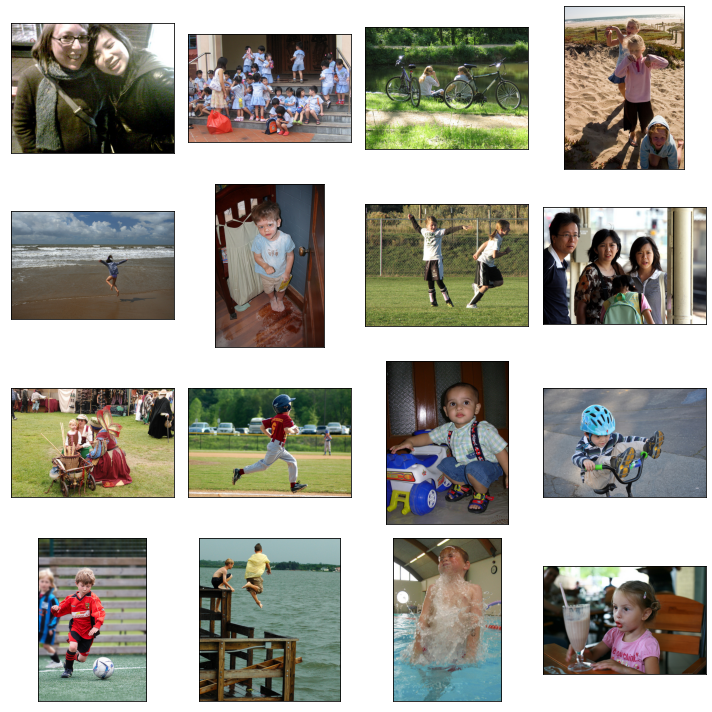

In [35]:
# формируем список выборки
samples = list(df_train[df_train['to_block'] == 1]['query_id'].sample(16))
samples = [i[:-2] for i in samples]

# задаем параметры графика
fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(PATH + 'train_images/' + samples[i])
    plt.imshow(image)   
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

- Судя по фотографиям, мы верно пометили запрещенный контент. 

- Удалим его из набора данных.

- Посчитаем общее количество изображений, которые требуется удалить из обучающего набора.

In [36]:
# создаем список "плохих" изображений 
bad_images = list(set(df_train[df_train['to_block'] == 1]['query_id'])) 
bad_images = [i[:-2] for i in bad_images] 
# считаем количество
print('Всего "плохих" изображений:', len(df_train.query('image in @bad_images'))) 

Всего "плохих" изображений: 1794


- Удалим строки с "плохими" изображениями из датасета.

In [37]:
# удаляем ненужные строки
df_train.drop(df_train.query('image in @bad_images').index, inplace=True)

# удаляем ненужный столбец
df_train.drop(columns='to_block', inplace=True)

# сбрасываем индекс
df_train.reset_index(inplace=True, drop=True)

In [38]:
# проверяем результат
display(df_train.head())
df_train.info()

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4028 entries, 0 to 4027
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       4028 non-null   object 
 1   query_id    4028 non-null   object 
 2   query_text  4028 non-null   object 
 3   score       4028 non-null   float64
dtypes: float64(1), object(3)
memory usage: 126.0+ KB


In [39]:
# проверяем наличие дубликатов
df_train.duplicated().sum()

0

### Вывод по второму шагу

- Проверили данные и исключили из обучения все описания и изображения, содержащие запрещённую информацию. 
- В итоговом датафрейме осталось 4028 записей.  

- Перейдём к векторизации изображений.

## Векторизация изображений

- Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. 


- Поэтому обратимся к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. 


- Будем использовать архитектуру предобученной на датасете ImageNet **ResNet-50**, посмотрим на слои и исключим один полносвязный, отвечающий за конечное предсказание. Также заморозим веса. 

- Приведем изображения в нужный формат: изменим размер картинки, вырежем центр и нормализуем.

In [40]:
# задаем параметры форматирования изображений
def create_image(mean=[0.485, 0.456, 0.406],
              std=[0.229, 0.224, 0.225]):
    
    '''Подготовка изображений '''
    norm = transforms.Normalize(mean=mean, 
                             std=std)
    preprocessor = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        norm
])
 
    return preprocessor


- Создадим модель для эмбеддингов изображений.

In [41]:
# задаём архитектуру сети
def create_model():
      
    ''' Формирование архитектуры нейросети'''
    
    # задаём архитектуру и параметры  предобученной сети
    resnet = models.resnet50(pretrained=True)

    # замораживаем веса
    for param in resnet.parameters():
        param.requires_grad_(False)

    # убираем последний слой    
    modules = list(resnet.children())[:-1]
    # активируем модель
    resnet = nn.Sequential(*modules)

    # переводим в режим предсказания
    resnet.eval() 
   
    return resnet  

- Создадим загрузчик данных и векторизатор. 

In [42]:
# превращаем данные в вектор
def vectorize_pictures(model, preprocessor, path=PATH, train=True):
    
    ''' Загрузка изображений и обучение модели '''

    image_embeddings = []
    photos = list(df_train['image'] if train else df_images['image'])
    
    for i in tqdm(range(len(photos))):
        if os.path.exists(path):
            image = Image.open(path+'train_images/'+photos[i] if train\
                              else path+'test_images/'+photos[i]).convert('RGB')
        else:
            print('Something is wrong')
       
        image_tensor  = preprocessor(image)
        output_tensor = model(image_tensor.unsqueeze(0)).flatten()
        image_embeddings.append(output_tensor.numpy())
    
    return np.asarray(image_embeddings)

- Запустим модель и векторизуем изображения.

In [43]:
# запускаем векторизацию 
features_image = vectorize_pictures(create_model(), create_image())

# проверяем итоговый размер признаков
print('Размерность признаков изображений:', features_image.shape)

100%|███████████████████████████████████████| 4028/4028 [12:37<00:00,  5.32it/s]


Размерность признаков изображений: (4028, 2048)


### Вывод по третьему шагу

- С помощью ResNet-50 получили векторизованные изображения для обучения.

- Размерность признаков: (4028, 2048).

- Перейдём к векторизации текстов.

## Векторизация текстов

- Для векторизации текстов применим трансформер BERT.

- Загрузим трансформер BERT base без корпуса и активируем токенизатор.

In [44]:
# загружаем модель и токенизатор BERT
bert = transformers.BertModel.from_pretrained('bert-base-uncased')
tokenizer = transformers.BertTokenizer.from_pretrained('bert-base-uncased')

- Создадим функции токенизации текста и создания эмбеддингов.

In [45]:
# создаем функцию-векторизатор
def vectorize_text(model, text, tokenizer=tokenizer, batch_size=BATCH_SIZE): 

    # токенизируем каждый текст
    tokenized = text.apply(
              lambda x: tokenizer.encode(
                     x, add_special_tokens=True, 
                     max_length=128, truncation=True))
    
    # ищем максимальную длину векторов 
    max_len = max([len(i) for i in tokenized.values])    
    # уравниваем длину векторов       
    padded = np.array([i + [0]*(max_len - len(i)) for i in tokenized.values])    
    # создаем маску для важных токенов 
    attention_mask = np.where(padded != 0, 1, 0)

   # векторизируем текст
    embeddings = []
    for i in tqdm(range(padded.shape[0] // batch_size)):
        batch = torch.LongTensor(padded[batch_size*i:batch_size*(i+1)])
        attention_mask_batch = torch.LongTensor(attention_mask[batch_size*i:batch_size*(i+1)])

        with torch.no_grad():
            batch_embeddings = model(batch, attention_mask=attention_mask_batch)

        embeddings.append(batch_embeddings[0][:,0,:].numpy())
    
    return np.concatenate(embeddings)    

- Создадим эмбеддинги обучающего набора.

In [46]:
# создаем вводную переменную
text = df_train['query_text']

# запускаем функцию
features_text = vectorize_text(bert, text)

# проверяем итоговый размер признаков
print('Размерность текстовых признаков:', features_text.shape)

100%|███████████████████████████████████████████| 38/38 [04:01<00:00,  6.37s/it]

Размерность текстовых признаков: (4028, 768)


###  Вывод по четвертому шагу

- Получили векторизованные тексты для обучения. 

- Размерность признаков: (4028, 768). 

## Объединение векторов

- Объединим полученные векторы изображений и векторы текстов с целевой переменной.

In [47]:
# объединяем векторы
X = np.concatenate((features_image, features_text), axis=1)
# проверяем 
X.shape

(4028, 2816)

In [48]:
# выделяем целевую переменную
y = np.array(df_train['score'])
# проверяем 
y.shape

(4028,)

### Вывод по пятому шагу

- Успешно объединили векторы изображений и текстов с целевой переменной.


- Размерность массива признаков: **(4028, 2816).**

- Размерность целевой переменной: **(4028,).**

## Обучение модели предсказания соответствия

Для обучения разделим датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того, чтобы учесть источник изображения при разбиении, воспользуемся классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.


Для работы выберем пять моделей:

   - DummyRegressor (в качестве базовой). 
   - Ridge.
   - RandomForestRegressor.
   - CatBoostRegressor.
   - NeuralNetwork.


Проверять точность предсказаний моделей будем метрикой *RMSE*. Она более чувствительна к выбросам и наболее интерпретируема из всех.

- Сначала разделим датасет на обучающую и валидационную выборки.

In [49]:
# запускаем класс разделителя
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=RAND_ST)

# получаем метки обучающей и валидационной выборок
train_indices, val_indices = next(gss.split(X=X, y=y, groups=df_train['image']))

In [50]:
# формируем признаки
X_train, X_val = X[train_indices], X[val_indices]

In [51]:
# формируем цель
y_train, y_val = y[train_indices], y[val_indices]

- Масштабируем признаки StandardScaler, чтобы нивелировать неравномерное распределение.

In [52]:
# масштабируем признаки
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_val = scaler.transform(X_val)

In [53]:
# проверяем итоговый размер признаков и целей
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

(2815, 2816)
(2815,)
(1213, 2816)
(1213,)


- Перейдем к обучению. Подбирать гиперпараметры будем вручную, так как кросс-валидация в этой задаче нам не подходит. 

- Для оценки моделей создадим общую функцию.

In [54]:
# создаем функцию, возвращающую оценку точности модели
def make_sсore(model):
    preds = model.predict(X_val)
    return model, mean_squared_error(y_val, preds, squared=False).round(3)

- **DummyRegressor**

In [55]:
# активируем модель и обучаем  
dm_model = DummyRegressor().fit(X_train, y_train)
# получаем оценку
model, dm_score = make_sсore(dm_model)
print(f'RMSE модели {model}: {dm_score}')

RMSE модели DummyRegressor(): 0.272


- **Ridge**

In [56]:
# активируем модель и обучаем  
rd_model = Ridge(random_state=RAND_ST, alpha=10000.).fit(X_train, y_train)
# получаем оценку
model, rd_score = make_sсore(rd_model)
print(f'RMSE модели {model}: {rd_score}')

RMSE модели Ridge(alpha=10000.0, random_state=12345): 0.253


- **RandomForestRegressor**

In [57]:
%%time
# активируем модель и обучаем  
rfr_model = RandomForestRegressor(random_state=RAND_ST,  
                                  n_estimators=8, max_depth=16).fit(X_train, y_train)
# получаем оценку
model, rfr_score = make_sсore(rfr_model)
print(f'RMSE модели {model}: {rfr_score}')

RMSE модели RandomForestRegressor(max_depth=16, n_estimators=8, random_state=12345): 0.264
CPU times: user 49.5 s, sys: 377 ms, total: 49.9 s
Wall time: 53.5 s


- **CatBoostRegressor.**

In [58]:
%%time
# активируем модель и обучаем 
cb = catboost.CatBoostRegressor(iterations=1000,
                                verbose=100, 
                                eval_metric='RMSE',
                                random_seed=RAND_ST)

train_pool = catboost.Pool(X_train, y_train)
val_pool = catboost.Pool(X_val, y_val)

cb.fit(train_pool,
       eval_set=val_pool,
       early_stopping_rounds=150)

Learning rate set to 0.059905
0:	learn: 0.2800972	test: 0.2712382	best: 0.2712382 (0)	total: 643ms	remaining: 10m 42s
100:	learn: 0.2102217	test: 0.2468415	best: 0.2468415 (100)	total: 40.6s	remaining: 6m 1s
200:	learn: 0.1668867	test: 0.2420272	best: 0.2420272 (200)	total: 1m 18s	remaining: 5m 11s
300:	learn: 0.1337601	test: 0.2398768	best: 0.2398351 (299)	total: 1m 56s	remaining: 4m 30s
400:	learn: 0.1086631	test: 0.2388926	best: 0.2388854 (399)	total: 2m 34s	remaining: 3m 51s
500:	learn: 0.0890126	test: 0.2378973	best: 0.2378973 (500)	total: 3m 12s	remaining: 3m 12s
600:	learn: 0.0738769	test: 0.2376309	best: 0.2375667 (596)	total: 3m 50s	remaining: 2m 33s
700:	learn: 0.0616460	test: 0.2375635	best: 0.2375635 (700)	total: 4m 28s	remaining: 1m 54s
800:	learn: 0.0519278	test: 0.2374891	best: 0.2372761 (750)	total: 5m 7s	remaining: 1m 16s
900:	learn: 0.0436766	test: 0.2375936	best: 0.2372761 (750)	total: 5m 45s	remaining: 38s
Stopped by overfitting detector  (150 iterations wait)

best

In [59]:
# получаем оценку
model, cb_score = make_sсore(cb)
print(f'RMSE модели {model}: {cb_score}')

RMSE модели <catboost.core.CatBoostRegressor object at 0x166e3d670>: 0.237


- **NeuralNetwork**

- Подготовим данные.

In [60]:
# создаем тензоры для обучения нейросети
X_train = torch.FloatTensor(X_train)
X_val = torch.FloatTensor(X_val)
y_train = torch.FloatTensor(y_train)
y_val = torch.FloatTensor(y_val)

In [61]:
# проверяем размер тензоров
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

torch.Size([2815, 2816])
torch.Size([2815])
torch.Size([1213, 2816])
torch.Size([1213])


- Зададим параметры.

In [62]:
# задаем количество эпох, нейронов в слоях и долю выключаемых нейронов
num_epochs = 500
dropout = 0.5
n_in_neurons = X_train.shape[1]

n_hidden_neurons_1 = 300
n_hidden_neurons_2 = 200
n_hidden_neurons_3 = 100
n_out_neurons = 1 

# задаем скорость обучения
learning_rate = 1e-5 # 0.001 1e-3

#  задаем функцию потерь 
loss = nn.MSELoss()  

- Зададим архитектуру нейросети.

In [63]:
# создаем класс модели и архитектуру
class Net(nn.Module):
    def __init__(self, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3, n_out_neurons):
            super(Net, self).__init__()

            self.fc1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
            self.act1 = nn.ReLU()
            self.drop1 = nn.Dropout(p=dropout)
            self.fc2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
            self.act2 = nn.ReLU()
            self.drop2 = nn.Dropout(p=dropout)
            self.fc3 = nn.Linear(n_hidden_neurons_2, n_hidden_neurons_3)
            self.act3 = nn.ReLU()
            self.drop3 = nn.Dropout(p=dropout)
            self.fc4 = nn.Linear(n_hidden_neurons_3, n_out_neurons)


    def forward(self, x):
        x = self.fc1(x)
        x = self.act1(x)
        x = self.drop1(x)
        x = self.fc2(x)
        x = self.act2(x)
        x = self.drop2(x)
        x = self.fc3(x)
        x = self.act3(x)
        x = self.drop3(x)
        x = self.fc4(x)

        return x

In [64]:
# загружаем параметры
NNet = Net(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3, n_out_neurons)

In [65]:
# выводим архитектуру
print('Архитектура нейросети:')
print(NNet) 

# проверяем работу
nnet_sq = NNet.forward(X_train) 
print('Среднее значение выхода:', nnet_sq.mean())

Архитектура нейросети:
Net(
  (fc1): Linear(in_features=2816, out_features=300, bias=True)
  (act1): ReLU()
  (drop1): Dropout(p=0.5, inplace=False)
  (fc2): Linear(in_features=300, out_features=200, bias=True)
  (act2): ReLU()
  (drop2): Dropout(p=0.5, inplace=False)
  (fc3): Linear(in_features=200, out_features=100, bias=True)
  (act3): ReLU()
  (drop3): Dropout(p=0.5, inplace=False)
  (fc4): Linear(in_features=100, out_features=1, bias=True)
)
Среднее значение выхода: tensor(0.0074, grad_fn=<MeanBackward0>)


- Запустим модель: обучим на трейне и получим предсказания на валидационной выборке. 

In [66]:
%%time
# задаем Adam оптимизатор  
optimizer = torch.optim.Adam(NNet.parameters(), lr=learning_rate)

# создаем списки оценок
test_loss_list = []
train_loss_list = []

best_rmse = 20000

# обучаем на заданном количестве эпох
for epoch in range(num_epochs):
    # прямой проход
    train_preds = NNet.forward(X_train).flatten()
    train_loss = loss(train_preds, y_train)
    
    # обратный проход
    train_loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    
    # получаем предсказание на валидационной выборке 
    NNet.eval()
    test_preds = NNet.forward(X_val).flatten()
   
    # рассчитывам rmse_loss и rmse_val
    test_loss = loss(test_preds, y_val)
    rmse_test = torch.sqrt(test_loss).item()
    rmse_train = torch.sqrt(train_loss).item()
    
    # добавляем rsme_loss и rmse_val в списки  
    test_loss_list.append(torch.sqrt(test_loss).item())
    train_loss_list.append(torch.sqrt(train_loss).item())
    
    # получаем лучшие значения rsme_loss, rmse_val и эпохи 
    if rmse_test < best_rmse:
        best_rmse = rmse_test
        best_epoch = epoch
        loss_train = rmse_train
        best_preds = test_preds
        
print(f'Best_epoch {best_epoch}, Best RMSE train {loss_train}, Best RMSE valid {best_rmse}')

Best_epoch 412, Best RMSE train 0.12038697302341461, Best RMSE valid 0.23641344904899597
CPU times: user 1min 58s, sys: 2.42 s, total: 2min 1s
Wall time: 1min 2s


- Выведем результаты работы нейросети на график.

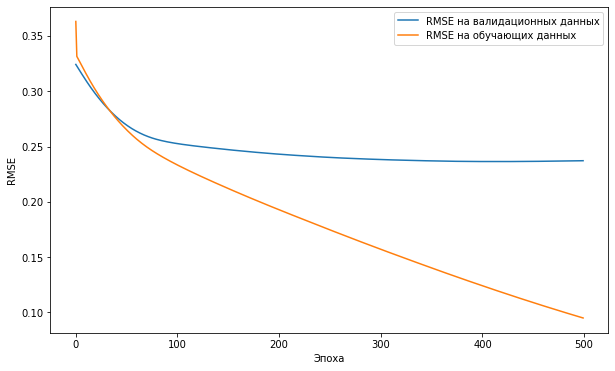

In [67]:
# строим график лосс-функции и rmse валидации
fig, ax = plt.subplots(figsize=(10,6))
plt.plot(test_loss_list, label='RMSE на валидационных данных')
plt.plot(train_loss_list, label='RMSE на обучающих данных')
plt.xlabel('Эпоха')
plt.ylabel('RMSE')
plt.legend()
plt.show()

- Метрика валидации на первых эпохах снижается, а затем, уже после 50 эпохи снижаться перестает, в отличие от лосс-функции. Модель переобучается. Смысла ставить больше 100 эпох, казалось бы нет, но, чем больше эпох, тем лучше получается метрика.   

- Объединим результаты работы моделей в одну таблицу.

In [68]:
# создаем датафрейм с итогами
result_dict = {'model':['DummyRegressor',
                        'Ridge',
                        'RandomForestRegressor',
                        'CatBoostRegressor',
                        'NNet',
                       ],
               'score':[dm_score,
                        rd_score,
                        rfr_score,
                        cb_score,
                        best_rmse,
                       ]
              }
# выводим результат
df_results = pd.DataFrame(result_dict)
df_results.sort_values(by='score')

,model,score
4,NNet,0.236413
3,CatBoostRegressor,0.237000
1,Ridge,0.253000
2,RandomForestRegressor,0.264000
0,DummyRegressor,0.272000


### Вывод по шестому шагу

- Разбили датасет на обучающую и валидационную выборки без дублирования и утечки данных.

- Выбрали модели. В качестве базовой выбрали усредняющую модель DummyRegressor.

- Выбрали метрику — *RMSE*. 

- Обучили разные модели. 

- Все модели превысили показатель базовой модели. 

- Лучшую метрику *RMSE* валидационной выборки показала *NeuralNetwork* — *0.236*. Это ниже, чем стандартное отклонение значений целевой переменной. 


- Перейдем к тестированию лучшей модели.

## Тестирование модели

- Протестируем модель *NeuralNetwork*.
- Для этого получим эмбеддинги для всех тестовых изображений из папки `test_images`, выберем случайные 10 запросов из файла `test_queries.csv`, обработаем и для каждого запроса выведем наиболее релевантное изображение. 
- Сравним визуально качество поиска.

- Создадим эмбеддинги изображений для теста.

In [69]:
# запускаем векторизацию 
pict_embeds_test = vectorize_pictures(create_model(), create_image(), train=False )

# проверяем итоговый размер признаков
print('Размерность признаков изображений:', pict_embeds_test.shape)

100%|█████████████████████████████████████████| 100/100 [00:19<00:00,  5.01it/s]

Размерность признаков изображений: (100, 2048)


- Напишем функцию, для обработки текстовых запросов из тестовой выборки.

In [70]:
# создаем функцию-векторизатор
def vectorize_text(model, text, tokenizer=tokenizer):   
    # формируем  токены
    tokenized = tokenizer(
                text,
                return_tensors="pt",
                add_special_tokens=True,
                max_length=128,
                truncation=True)  
    # создаем эмбеддинги
    with torch.no_grad():
        outputs = model(**tokenized)
        last_hidden_states = outputs.last_hidden_state
    
    embedding = last_hidden_states.mean(dim=1)
    return  embedding

- Напишем функцию для получения наиболее схожего с описанием изображения: функция принимает на вход текстовое описание, делает его векторизацию и возвращает картинку с максимальным значением метрики.

In [71]:
# создаем функцию сопоставления изображений с запросом 
def get_picture(text) -> None:
    
    # проверяем, не нужно ли вывести на экран заглушку
    if [i for i in get_lemmas(text) if i in BLOCK]: 
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        # получаем эмбеддинг текста
        text_embed = vectorize_text(model=bert, text=[text]) 
                
        # объединяем векторы тестовых картинок с эмбеддингом текста
        X = np.concatenate(( 
            pict_embeds_test,
            np.resize(text_embed, (pict_embeds_test.shape[0],768))),
            axis=1)
        X = scaler.transform(X)
        
        # получаем предсказания экпертных оценок
        #predictions = cb.predict(X) 
        
        # создаем тензор для обучения нейросети
        X = torch.FloatTensor(X)
        # получаем предсказания экпертных оценок      
        with torch.no_grad():
            predictions = NNet.forward(X).flatten() 
             
        # добавляем оценки к номерам изображений
        df = pd.concat((df_images, 
                        pd.Series(np.reshape(predictions, 
                                             (predictions.shape[0],)), name='pred')), axis=1) 
        
        # получаем топ 5 имён файлов с изображениями
        top = list(df.sort_values(by='pred', ascending=False)['image'].head(5)) 
        
        # получаем топ 5 оценок
        top_score = list(df.sort_values(by='pred', ascending=False)['pred'].head(5)) 
        
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        
        # выводим на экран 5 наиболее похожих изображений
        fig = plt.figure(figsize=(15,5)) 
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(top_score[i], 2))
            image = Image.open(PATH+'test_images/'+top[i])
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        # если текст был в исходном файле с описаниями - добавляем оригинальное изображение
        if text in list(df_queries['query_text']): 
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(PATH+'test_images/'\
                               +df_queries.iloc[df_queries[df_queries['query_text'] == text].index[0]]['image'])
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        plt.show()

    return None

- Выберем 10 случайных запросов из файла с тестовыми запросами и посмотрим на результат работы функции.

In [72]:
# формируем список случайных запросов
samples = df_queries.sample(10)
text_test = list(samples['query_text'])
# проверяем
text_test

['Girls with orange hair standing on the street with some kind of bottle in their hand .',
 'Five women in red shirts clapping .',
 'A dog jumping off a dock into a pool of water .',
 'A man in a white hat is standing behind a woman with a red shawl over her head .',
 'A little boy plays with a basketball and a toy basketball hoop .',
 'The young girl is cross-country skiing .',
 'A playful puppy bites the shirt of a young boy .',
 'A child flying a kite .',
 'A man is operating a television camera high up in a crowded stadium .',
 'a brown and white dog standing on the street wearing a hat , shirt and jeans .']


-------------------- Girls with orange hair standing on the street with some kind of bottle in their hand . --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- Five women in red shirts clapping . --------------------



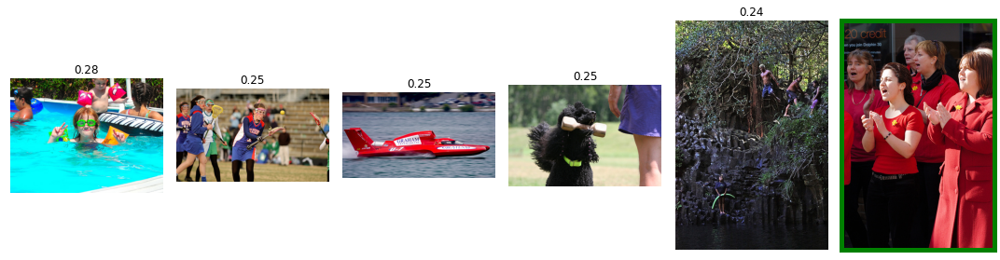


-------------------- A dog jumping off a dock into a pool of water . --------------------



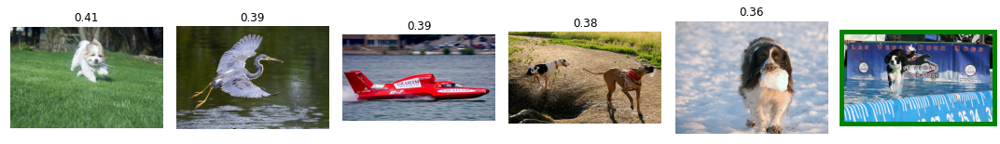


-------------------- A man in a white hat is standing behind a woman with a red shawl over her head . --------------------



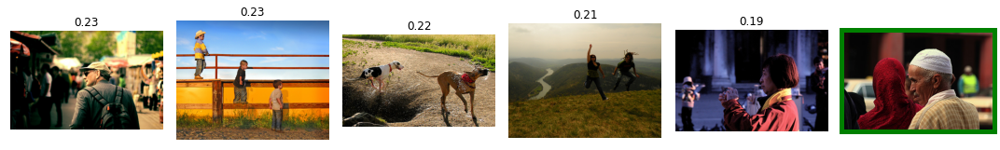


-------------------- A little boy plays with a basketball and a toy basketball hoop . --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- The young girl is cross-country skiing . --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- A playful puppy bites the shirt of a young boy . --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- A child flying a kite . --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- A man is operating a television camera high up in a crowded stadium . --------------------



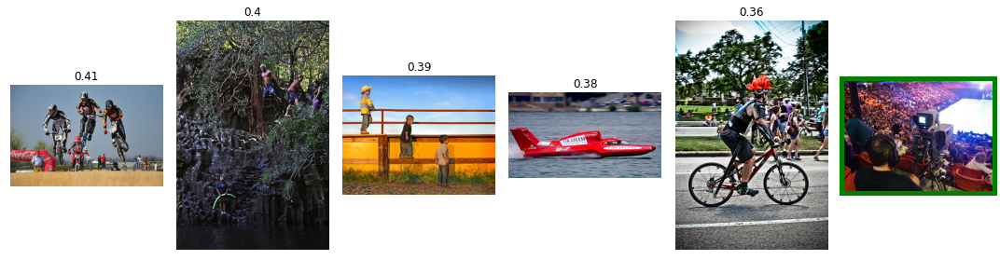


-------------------- a brown and white dog standing on the street wearing a hat , shirt and jeans . --------------------



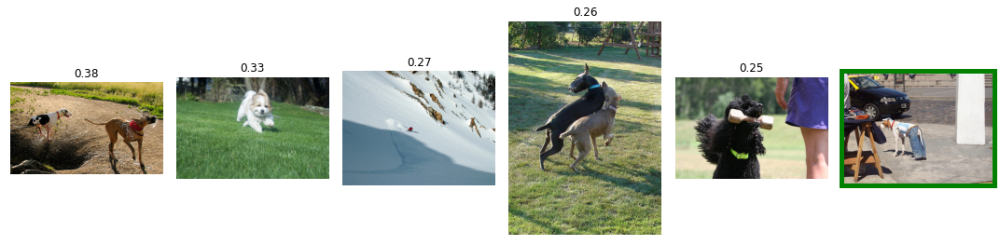

In [73]:
# проверяем работу модели
for text in text_test:
    get_picture(text)

- Схема работает, результат хороший, но, судя по выведенным по описаниям фотографиям, модель не всегда попадает в точку.

- Запускаем демонстрацию соответствия запроса выводимому изображению.

In [74]:
# формируем запросы
requests = ['multiple trees',
            'dog is playing',
            'We do business around the world',
            'man in the park',
            'hollidays'
           ]


-------------------- multiple trees --------------------



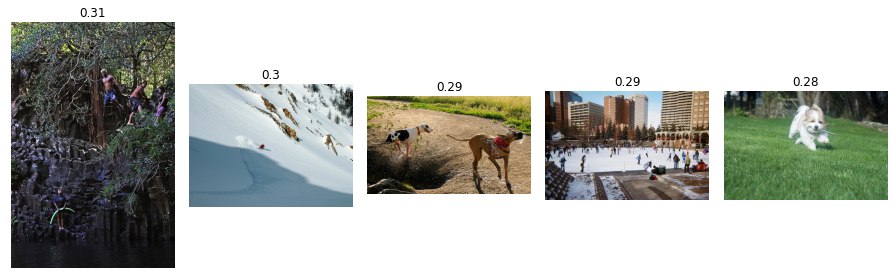


-------------------- dog is playing --------------------



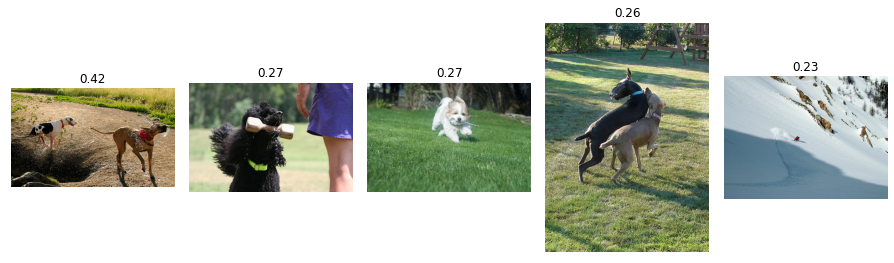


-------------------- We do business around the world --------------------



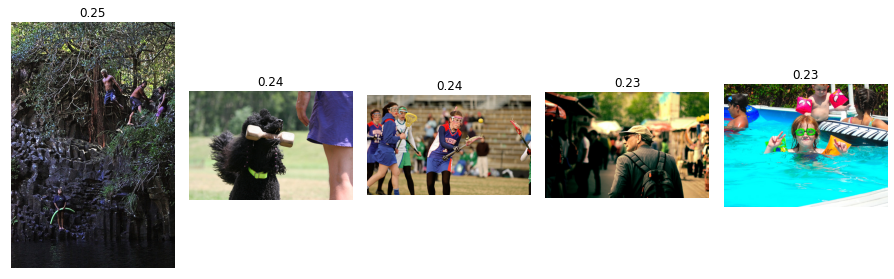


-------------------- man in the park --------------------



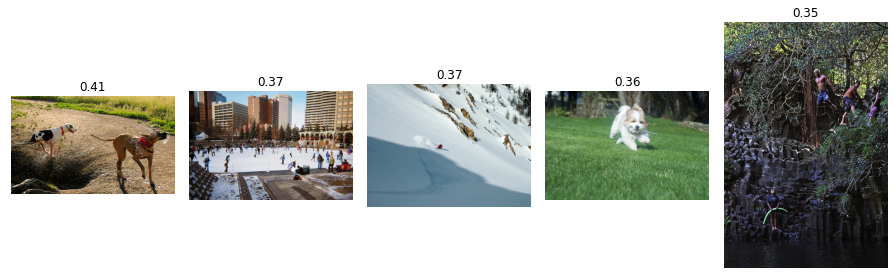


-------------------- hollidays --------------------



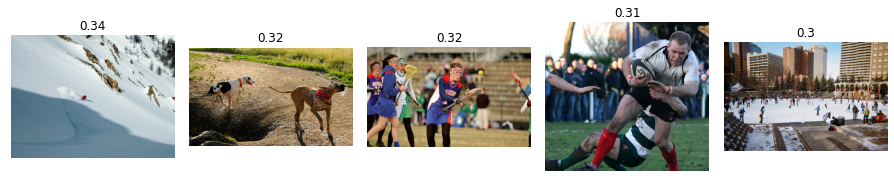

In [75]:
# запускаем функцию
for text in requests:
    get_picture(text)

- Здесь результат получше. Но тоже не идеал. 

### Вывод по седьмому шагу


- Протестировали лучшую модель — NeuralNetwork:

  - Получили эмбеддинги для тестовых изображений и описаний.
  - Сформировали 10 случайных описаний и нашли и сравнили пять, определенных моделью изображений, наиболее подходящих под каждое описание. 
  - Написали пять запросов и вывели наиболее релевантные изображения.
  - Сравнили качество поиска модели с соответствующими описаниям изображениями.
  
  
- Модель показала высокую метрику *RMSE* — *0.236*, но не выдающееся качество поиска по запросу.   

## Общий вывод 

В рамках проекта мы создали и протестировали демонстрационную версию для системы поиска изображений по описанию.

В ходе работы над проектом мы:

  - Загрузили данные и провели их исследовательский анализ.
  - Проверили и объединили оценки экспертов и краудсорсеров.
  - Исключили из датасета объекты, которые выходят за рамки юридических ограничений.
  - Векторизовали изображения с помощью ResNet50 и текстовые описания — с Bert base uncased. 
  - Объединили векторы изображений и текстов. 
  - Разбили данные на обучающую и валидационную выборки.
  - Выбрали модели и метрику оценки качества их работы.
  - Обучили модели и выбрали лучшую.
  - Протестировали отобранную модель с помощью функции, которая по текстовому описанию возвращает изображение с максимальным значением метрики.
  - Протестируйте работу модели на нескольких текстовых запросах.
  - Сформулировали и оформили промежуточный и общий выводы.


**Резюме:**

- К сожалению, несмотря на высокое качество работы модели, продукт показывает неидеальную стабильность с точки зрения предоставления релевантных результатов. Не всегда в выдачу попадает верное изображение, но чуть чаще, попадают фотографии, связанные тематически. 
- Вероятно, поможет более упорная борьба с переобучением модели.  
- Также, возможно, предоставленный нам датасет содержит слишком мало данных для поиска хотя бы одного дополнительного изображения, связанного с предоставленным описанием. В таком виде продукт рано применять в реальной работе. 
- Улучшить показатели сети могло бы увеличение предоставленных данных как для тренировки, так и для тестирования.

## Дополненительное решение: CLIP

Рассмотрим готовое коробочное решение для задачи поиска картинки по тексту на базе нейронной сеть CLIP от OPEN AI.

Воспользуемся библиотекой sentence-transformers с предобученным нейросетевым триплетом clip-ViT-B-32 на 400М пар изображение-описание. В данной модели эмбеддинги изображений и текста переводятся в одно векторное пространство, в котором вектора пар изображение-текст будут максимально коллинеарны друг другу.

- Объявим и загрузим модель.

In [76]:
# активируем модель
clip_model = SentenceTransformer('clip-ViT-B-32', device='cpu')

- Создадим список с путями к изображениям из тестового набора и получим их эмбеддинги.

In [77]:
# создаем список изображений и описаний
img_names = list(glob.glob(PATH +'/test_images/*.jpg'))

# проверяем 
print("Images:", len(img_names))

# формируем эмбеддинги изображений
img_emb = clip_model.encode([Image.open(filepath) for filepath in img_names], 
                            batch_size=128, convert_to_tensor=True, show_progress_bar=True)

Images: 100


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

- Создадим функцию поиска изображений по описанию.

In [78]:
def search(query, k=5):
    
    # проверяем, не нужно ли вывести на экран заглушку
    if [i for i in get_lemmas(query) if i in BLOCK]: 
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')

    # получаем эмбеддинг запроса
    query_emb = clip_model.encode([query], 
                                  convert_to_tensor=True, 
                                  show_progress_bar=False)
    
    # Используем функцию util.semantic_search, которая вычисляет косинусную схожесть
    # между эмбеддингом запроса и всеми картинками из базы.
    # Далее функция возвращает top_k картинок с наивысшим рейтингом     
    hits = util.semantic_search(query_emb, img_emb, top_k=k)[0]
      
    print("Query:")   
    display(query)
    
    #выводим на экран 5 наиболее похожих картинок
    fig = plt.figure(figsize=(15,5))
    plt.rcParams['axes.edgecolor'] = 'black'
    plt.rcParams['axes.linewidth'] = 0
    
    for i in range(5):
        fig.add_subplot(1, 6, i+1, title=round(hits[i]['score'], 2))
        image = Image.open(img_names[hits[i]['corpus_id']])       
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
        
    # если текст был в исходном файле с описаниями - добавляем оригинальную картинку
    if text in list(df_queries['query_text']): 
        plt.rcParams['axes.edgecolor'] = 'green'
        plt.rcParams['axes.linewidth'] = 5
        fig.add_subplot(1, 6, 6)
        image = Image.open(PATH+'test_images/'\
                           +df_queries.iloc[df_queries[df_queries['query_text'] == text].index[0]]['image'])
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()

    plt.show()

- Выведем 5 изображений, наиболее подходящих по описанию.


-------------------- Girls with orange hair standing on the street with some kind of bottle in their hand . --------------------

This image is unavailable in your country in compliance with local laws.

Query:


'Girls with orange hair standing on the street with some kind of bottle in their hand .'

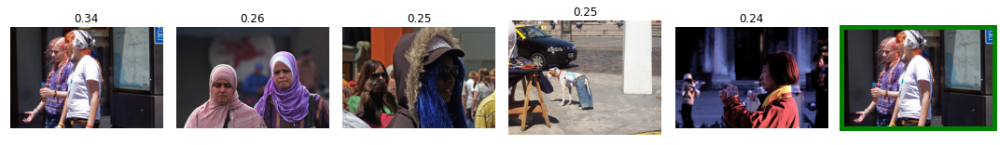

Query:


'Five women in red shirts clapping .'

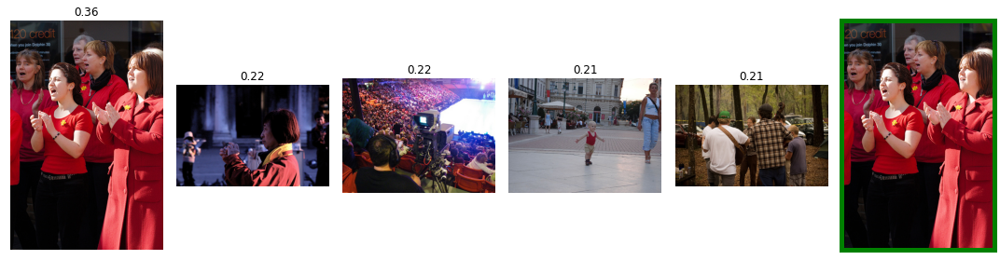

Query:


'A dog jumping off a dock into a pool of water .'

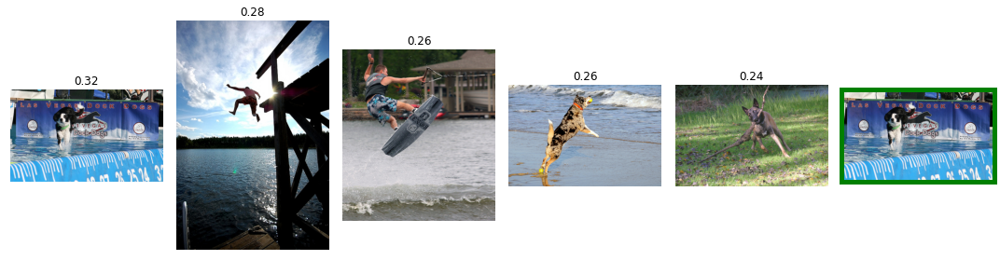

Query:


'A man in a white hat is standing behind a woman with a red shawl over her head .'

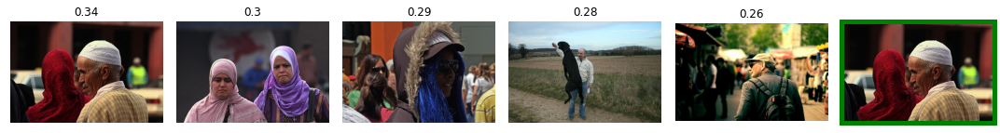


-------------------- A little boy plays with a basketball and a toy basketball hoop . --------------------

This image is unavailable in your country in compliance with local laws.

Query:


'A little boy plays with a basketball and a toy basketball hoop .'

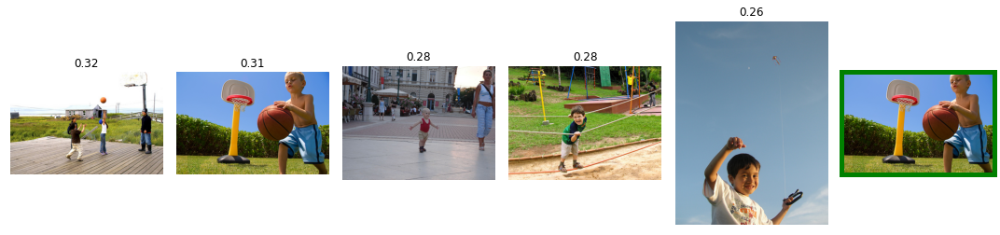


-------------------- The young girl is cross-country skiing . --------------------

This image is unavailable in your country in compliance with local laws.

Query:


'The young girl is cross-country skiing .'

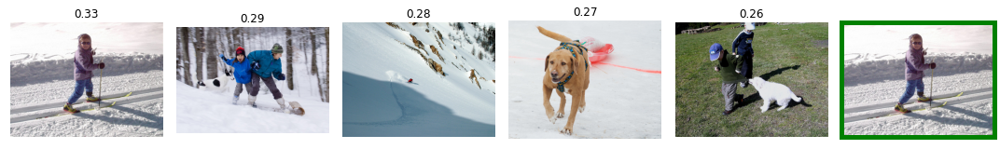


-------------------- A playful puppy bites the shirt of a young boy . --------------------

This image is unavailable in your country in compliance with local laws.

Query:


'A playful puppy bites the shirt of a young boy .'

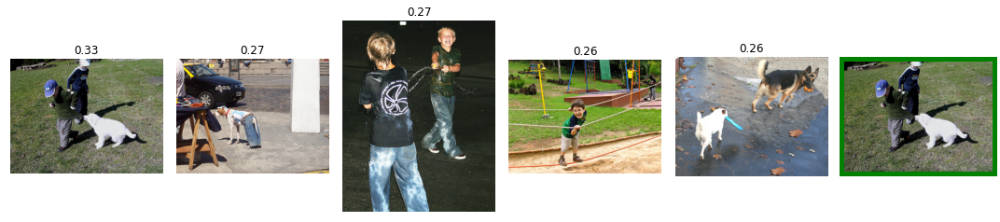


-------------------- A child flying a kite . --------------------

This image is unavailable in your country in compliance with local laws.

Query:


'A child flying a kite .'

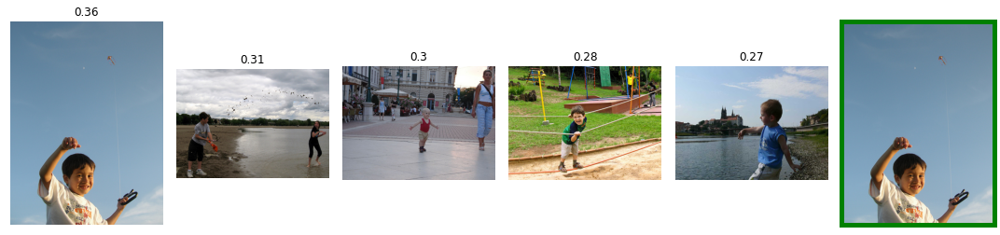

Query:


'A man is operating a television camera high up in a crowded stadium .'

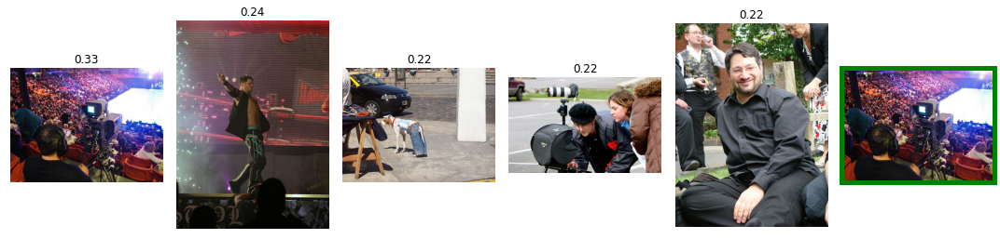

Query:


'a brown and white dog standing on the street wearing a hat , shirt and jeans .'

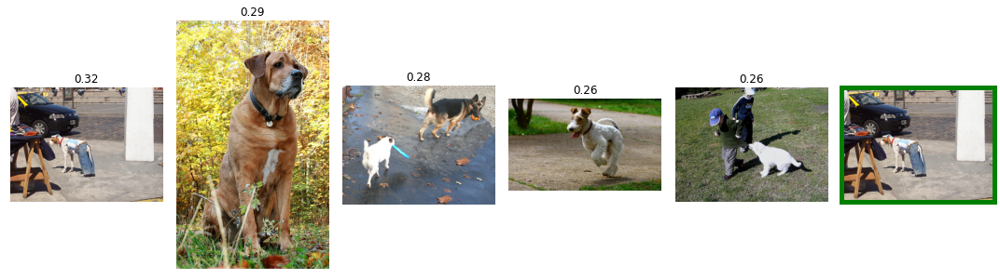

In [79]:
# проверяем работу модели
for text in text_test:
    search(text)

- Выведем 5 изображений, подходящих под сформированный запрос. 

Query:


'multiple trees'

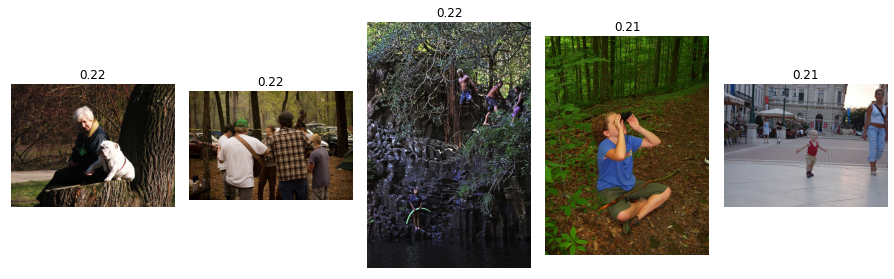

Query:


'dog is playing'

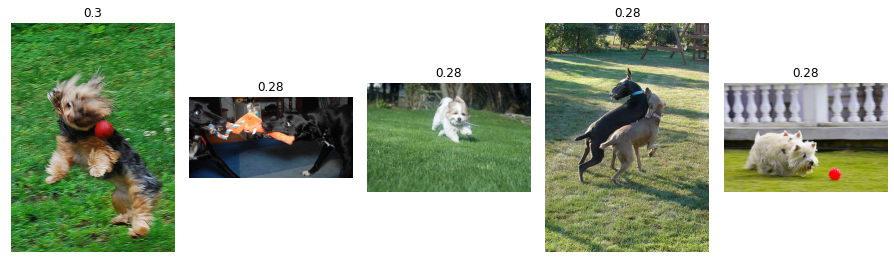

Query:


'We do business around the world'

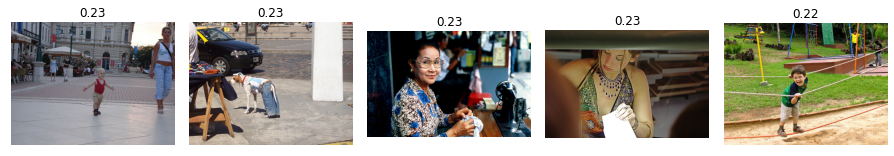

Query:


'man in the park'

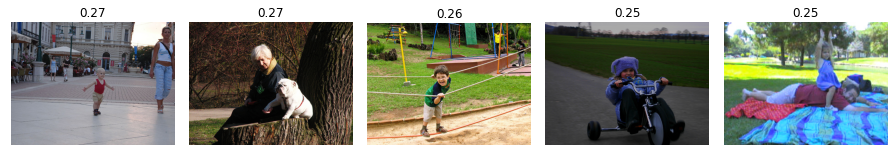

Query:


'hollidays'

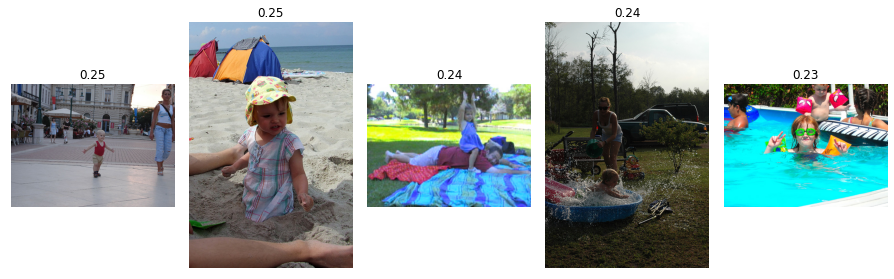

In [80]:
# запускаем функцию 
for text in requests:
    search(text)

**Вывод:**

- Модель CLIP демонстрирует безупречный результат. 